In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from mpl_toolkits.axes_grid1 import AxesGrid

In [2]:
#read the object function
box = 300
obj = np.load('10/Affine1/obj.npy')
obj = obj[0,:,:]+1j*obj[1,:,:]
middley = int(obj.shape[0]/2)
middlex = int(obj.shape[1]/2)
#read the position data
pos_new = np.load("10/Affine1/pos.npy")
pos_init = np.load("10/pos init.npy")
pos_init = pos_init[0]
pos_inc =  pos_new[0] - pos_init
# data coordinates and values
x_pos = pos_new[0, :, 0]
y_pos = pos_new[0, :, 1]

In [3]:
# target grid to interpolate to
X, Y = np.meshgrid(np.arange(0, obj.shape[1]), np.arange(0, obj.shape[0]))
# interpolate
dispy = griddata((x_pos,y_pos),pos_inc[:,0],(X,Y), method='linear', fill_value= 0.0)
dispy = np.reshape(dispy, obj.shape)
dispx = griddata((x_pos,y_pos),pos_inc[:,1],(X,Y), method='linear', fill_value= 0.0)
dispx = np.reshape(dispx, obj.shape)
obj = obj[(middley-box):(middley+box),(middlex-box):(middlex+box)]
dispx = dispx[(middley-box):(middley+box),(middlex-box):(middlex+box)]
dispy = dispy[(middley-box):(middley+box),(middlex-box):(middlex+box)]

<ipython-input-4-4e56ec4a8351>:10: MatplotlibDeprecationWarning: Since 3.2, mpl_toolkits's own colorbar implementation is deprecated; it will be removed two minor releases later.  Set the 'mpl_toolkits.legacy_colorbar' rcParam to False to use Matplotlib's default colorbar implementation and suppress this deprecation warning.
  grid.cbar_axes[0].colorbar(im)
C:\Users\sning\anaconda3\lib\site-packages\mpl_toolkits\axes_grid1\axes_grid.py:46: MatplotlibDeprecationWarning: 
The mpl_toolkits.axes_grid1.colorbar module was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use matplotlib.colorbar instead.
  from .colorbar import Colorbar
<ipython-input-4-4e56ec4a8351>:13: MatplotlibDeprecationWarning: Since 3.2, mpl_toolkits's own colorbar implementation is deprecated; it will be removed two minor releases later.  Set the 'mpl_toolkits.legacy_colorbar' rcParam to False to use Matplotlib's default colorbar implementation and suppress this deprecation warning.
  grid.cb

Text(0.5, 1.0, 'y displacement')

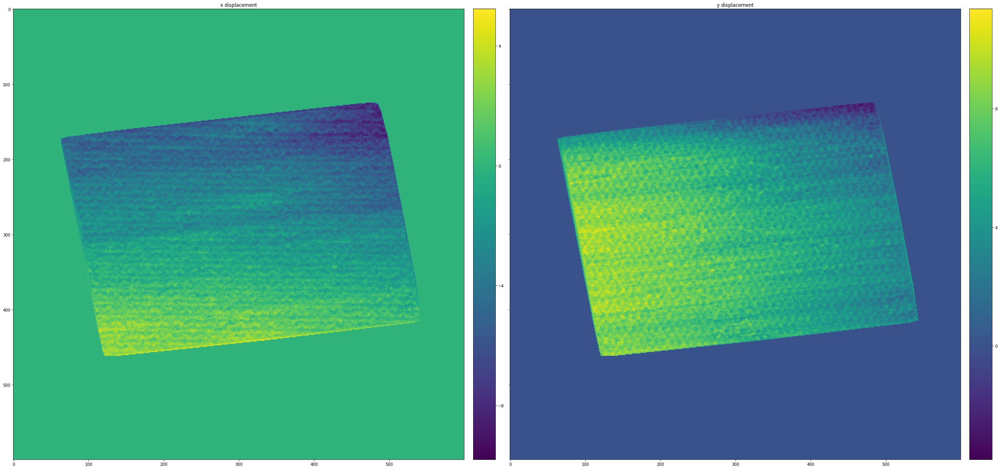

In [4]:
fig =plt.figure(1, figsize=(150, 75))
grid=AxesGrid(fig, 236, nrows_ncols=(1,2),
             axes_pad=0.5,
             share_all=False,
             cbar_location="right",
             cbar_mode="each",
             cbar_size="5%",
             cbar_pad="2%")
im=grid[0].imshow(dispx, cmap=plt.cm.viridis)
grid.cbar_axes[0].colorbar(im)
grid[0].set_title("x displacement")
im=grid[1].imshow(dispy, cmap=plt.cm.viridis)
grid.cbar_axes[1].colorbar(im)
grid[1].set_title("y displacement")

<ipython-input-5-ac126ecf4a8b>:11: MatplotlibDeprecationWarning: Since 3.2, mpl_toolkits's own colorbar implementation is deprecated; it will be removed two minor releases later.  Set the 'mpl_toolkits.legacy_colorbar' rcParam to False to use Matplotlib's default colorbar implementation and suppress this deprecation warning.
  grid.cbar_axes[0].colorbar(im)
<ipython-input-5-ac126ecf4a8b>:14: MatplotlibDeprecationWarning: Since 3.2, mpl_toolkits's own colorbar implementation is deprecated; it will be removed two minor releases later.  Set the 'mpl_toolkits.legacy_colorbar' rcParam to False to use Matplotlib's default colorbar implementation and suppress this deprecation warning.
  grid.cbar_axes[1].colorbar(im)
<ipython-input-5-ac126ecf4a8b>:17: MatplotlibDeprecationWarning: Since 3.2, mpl_toolkits's own colorbar implementation is deprecated; it will be removed two minor releases later.  Set the 'mpl_toolkits.legacy_colorbar' rcParam to False to use Matplotlib's default colorbar impleme

Text(0.5, 1.0, 'object FFT')

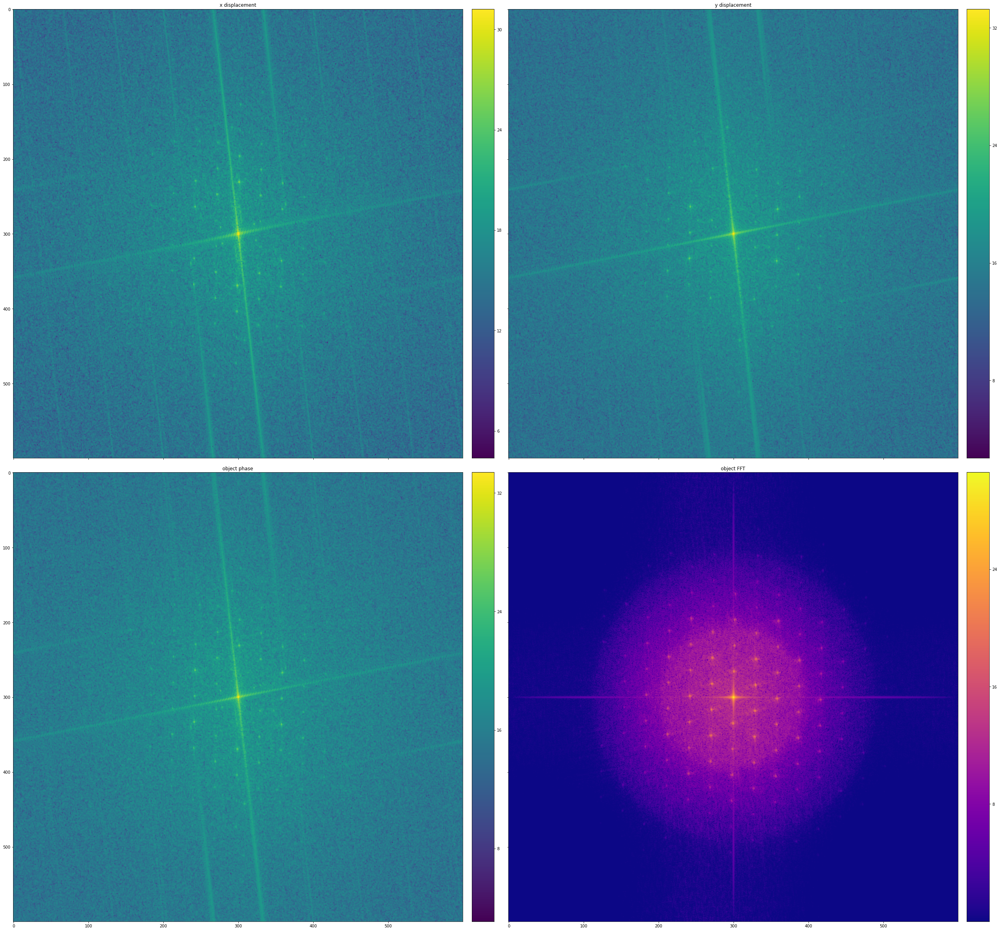

In [5]:
window2d = np.sqrt(np.outer(np.abs(np.hanning(dispx.shape[0])),np.abs(np.hanning(dispx.shape[1]))))
fig =plt.figure(1, figsize=(150, 150))
grid=AxesGrid(fig, 236, nrows_ncols=(2,2),
             axes_pad=0.5,
             share_all=False,
             cbar_location="right",
             cbar_mode="each",
             cbar_size="5%",
             cbar_pad="2%")
im=grid[0].imshow(np.log(np.square(np.abs(np.fft.fftshift(np.fft.fft2(dispx*window2d))))*1000+1.0), cmap=plt.cm.viridis)
grid.cbar_axes[0].colorbar(im)
grid[0].set_title("x displacement")
im=grid[1].imshow(np.log(np.square(np.abs(np.fft.fftshift(np.fft.fft2(dispy*window2d))))*1000+1.0), cmap=plt.cm.viridis)
grid.cbar_axes[1].colorbar(im)
grid[1].set_title("y displacement")
im=grid[2].imshow(np.log(np.square(np.abs(np.fft.fftshift(np.fft.fft2(dispx*window2d + 1j*dispy*window2d))))*1000+1.0), cmap=plt.cm.viridis)
grid.cbar_axes[2].colorbar(im)
grid[2].set_title("object phase")
im=grid[3].imshow(np.log(np.square(np.abs(np.fft.fftshift(np.fft.fft2(obj*window2d))))*1000+1.0), cmap=plt.cm.plasma)
grid.cbar_axes[3].colorbar(im)
grid[3].set_title("object FFT")

In [6]:
#find the matched positions with pixel precision.
def MatchTemplate(I,template,radius,threshold):
    kernel=cv2.getStructuringElement(cv2.MORPH_RECT,(radius, radius))
    corr_map = cv2.matchTemplate(I,template,cv2.TM_CCOEFF_NORMED)
    dialated_corr= cv2.dilate(corr_map, kernel)
    peak_idx=np.asarray(np.where((corr_map>= dialated_corr)&(corr_map>threshold))).T
    return peak_idx
#refine the averaged template with pixel precison.
def RefineTemplate(I, template, matched_pos):
    filtered_pos = []
    point_num = matched_pos.shape[0]
    new_template = np.zeros_like(template)
    for i in range(point_num):
        x_pos = matched_pos[i, 1]
        y_pos = matched_pos[i, 0]
        if (x_pos<0):
            continue
        if (y_pos<0):
            continue
        if (y_pos+template.shape[0]>I.shape[0]):
            continue
        if (x_pos+template.shape[1]>I.shape[1]):
            continue
        filtered_pos.append([y_pos, x_pos])
        new_template+= I[y_pos:(y_pos+template.shape[0]), x_pos:(x_pos+template.shape[1])]
    new_template/=point_num
    filtered_pos = np.asarray(filtered_pos)
    return new_template, filtered_pos
def UcellDetect(I, template, radius, threshold):
    peak_idx = MatchTemplate(I,template,radius,threshold)
    #get the averaged template
    new_template, peak_idx = RefineTemplate(I, template, peak_idx)
    #pick up the maximum from the template.
    max_loc = np.unravel_index(np.argmax(new_template), new_template.shape)
    row_shift = max_loc[0]-int(new_template.shape[0]/2)
    col_shift = max_loc[1]-int(new_template.shape[1]/2)
    peak_idx[:,0] += row_shift
    peak_idx[:,1] += col_shift
    #generate the tempalte again.
    new_template, peak_idx = RefineTemplate(I, template, peak_idx)
    return new_template, peak_idx

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


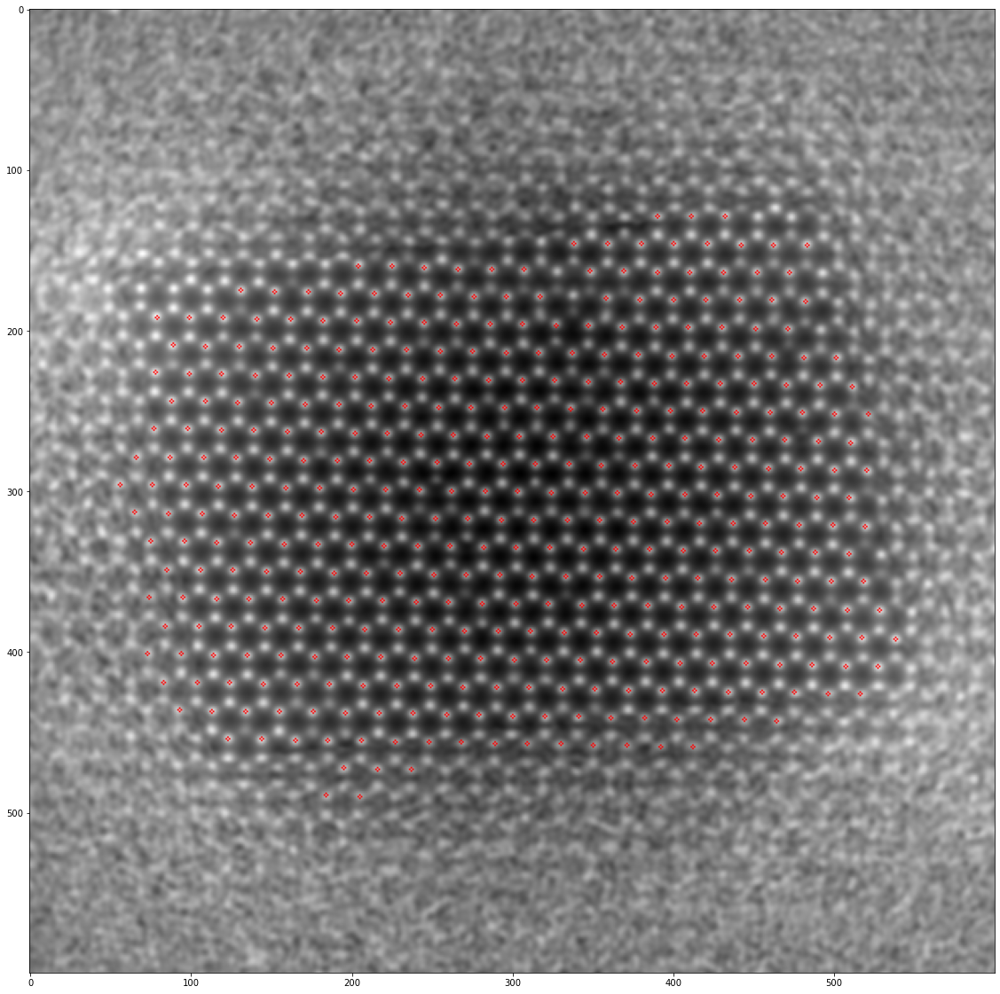

In [7]:
#use template mathcing to generate the avraged displacement field.
x_start = box
y_start = box
temp_size = 60
half_size = int(temp_size/2)
phase = np.float32(np.angle(obj))
phase = (phase - np.min(phase))/(np.max(phase)- np.min(phase))
mtemplate = phase[y_start:y_start+temp_size,x_start:x_start+temp_size]
mtemplate, mo_pos=UcellDetect(phase, mtemplate, 10, 0.95)
rgb_frame=cv2.cvtColor(phase, cv2.COLOR_GRAY2BGR)
mo_pos = MatchTemplate(phase, mtemplate, 10, 0.85)
for i in range(0, mo_pos.shape[0]):
    cv2.circle(rgb_frame,(mo_pos[i, 1]+ half_size,mo_pos[i, 0]+ half_size),1,(255,0,0))
plt.figure(figsize=(20,20))
plt.imshow(rgb_frame)

<ipython-input-8-8912c92af1e2>:12: MatplotlibDeprecationWarning: Since 3.2, mpl_toolkits's own colorbar implementation is deprecated; it will be removed two minor releases later.  Set the 'mpl_toolkits.legacy_colorbar' rcParam to False to use Matplotlib's default colorbar implementation and suppress this deprecation warning.
  grid.cbar_axes[0].colorbar(im)
<ipython-input-8-8912c92af1e2>:15: MatplotlibDeprecationWarning: Since 3.2, mpl_toolkits's own colorbar implementation is deprecated; it will be removed two minor releases later.  Set the 'mpl_toolkits.legacy_colorbar' rcParam to False to use Matplotlib's default colorbar implementation and suppress this deprecation warning.
  grid.cbar_axes[1].colorbar(im)
<ipython-input-8-8912c92af1e2>:18: MatplotlibDeprecationWarning: Since 3.2, mpl_toolkits's own colorbar implementation is deprecated; it will be removed two minor releases later.  Set the 'mpl_toolkits.legacy_colorbar' rcParam to False to use Matplotlib's default colorbar impleme

Text(0.5, 1.0, 'averaged sulfuer template')

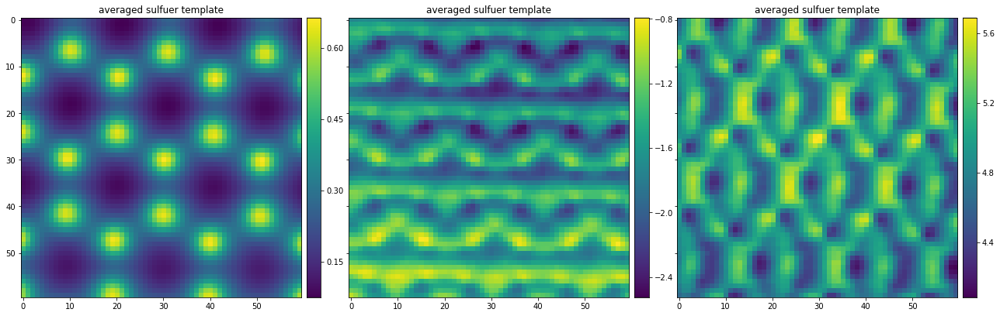

In [8]:
xtemplate, mo_pos = RefineTemplate(np.float32(dispx), mtemplate, mo_pos)
ytemplate, mo_pos = RefineTemplate(np.float32(dispy), mtemplate, mo_pos)
fig =plt.figure(1, figsize=(75, 25))
grid=AxesGrid(fig, 236, nrows_ncols=(1,3),
             axes_pad=0.5,
             share_all=False,
             cbar_location="right",
             cbar_mode="each",
             cbar_size="5%",
             cbar_pad="2%")
im=grid[0].imshow(mtemplate, cmap=plt.cm.viridis)
grid.cbar_axes[0].colorbar(im)
grid[0].set_title("averaged sulfuer template")
im=grid[1].imshow(xtemplate, cmap=plt.cm.viridis)
grid.cbar_axes[1].colorbar(im)
grid[1].set_title("averaged sulfuer template")
im=grid[2].imshow(ytemplate, cmap=plt.cm.viridis)
grid.cbar_axes[2].colorbar(im)
grid[2].set_title("averaged sulfuer template")